In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [4]:
df=pd.read_csv("diabetes (2).csv")

In [5]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [6]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [7]:
df.duplicated().sum()

0

EDA

array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

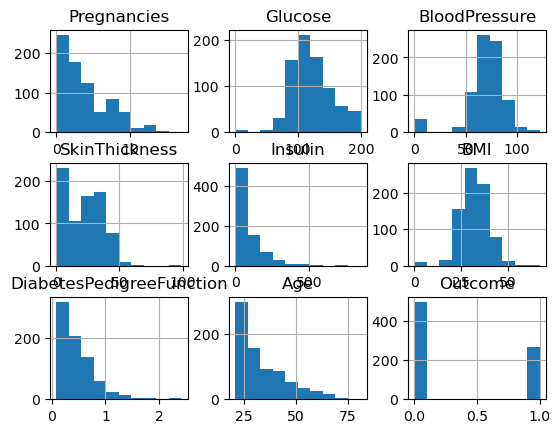

In [9]:
df.hist()

<Axes: >

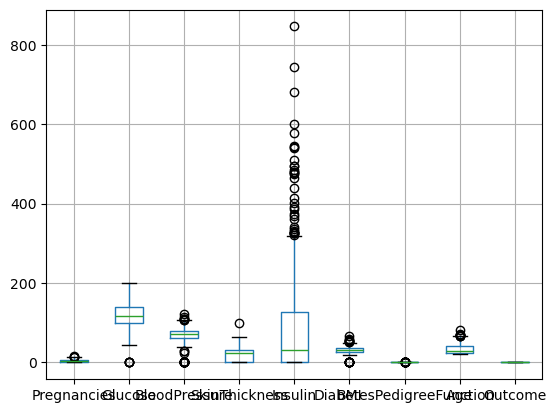

In [10]:
df.boxplot()

In [11]:
def outlier_capping(df,column):
    q1=df[column].quantile(0.25)
    q3=df[column].quantile(0.75)
    iqr=q3-q1
    lower_extreme=q1-1.5*iqr
    upper_extreme=q3+1.5*iqr
    df[column]=df[column].apply(lambda x: lower_extreme if x<lower_extreme else upper_extreme if x>upper_extreme else x)
for col in df.select_dtypes(["int","float"]).columns:
    outlier_capping(df,col)
    

<Axes: >

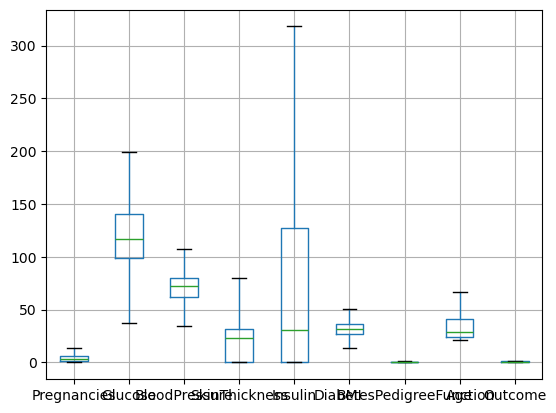

In [12]:
df.boxplot()

<Axes: >

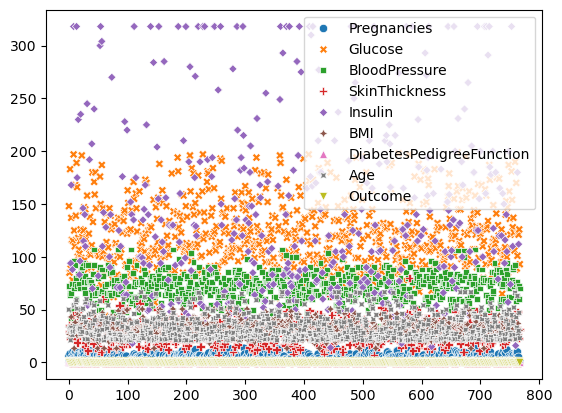

In [13]:
sns.scatterplot(df)

<Axes: >

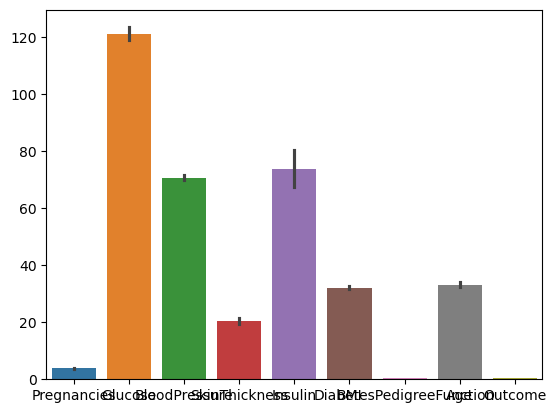

In [14]:
sns.barplot(df)

In [15]:
corr=df.corr()
corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.128987,0.184307,-0.084349,-0.077793,0.024681,-0.017398,0.549695,0.220392
Glucose,0.128987,1.000000,0.197865,0.059806,0.315856,0.235542,0.120213,0.269056,0.479158
BloodPressure,0.184307,0.197865,1.000000,0.152644,0.050080,0.282544,0.038793,0.304208,0.113301
SkinThickness,-0.084349,0.059806,0.152644,1.000000,0.488101,0.401494,0.177920,-0.119170,0.073125
Insulin,-0.077793,0.315856,0.050080,0.488101,1.000000,0.209665,0.190087,-0.065547,0.124721
BMI,0.024681,0.235542,0.282544,0.401494,0.209665,1.000000,0.141087,0.043375,0.309739
DiabetesPedigreeFunction,-0.017398,0.120213,0.038793,0.177920,0.190087,0.141087,1.000000,0.047289,0.184969
Age,0.549695,0.269056,0.304208,-0.119170,-0.065547,0.043375,0.047289,1.000000,0.242702
Outcome,0.220392,0.479158,0.113301,0.073125,0.124721,0.309739,0.184969,0.242702,1.000000


<Axes: >

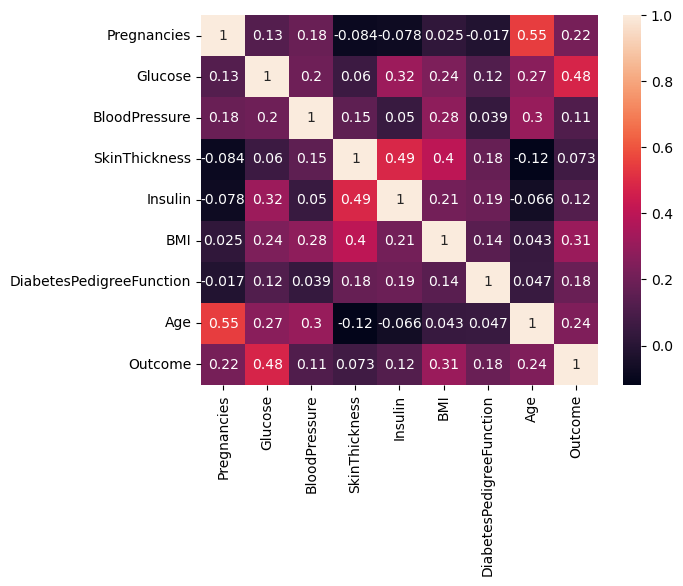

In [16]:
sns.heatmap(corr,annot=True)

DATA PREPROCESSING

In [18]:
## There is no missing values,so there is any imputation to the dataset

In [19]:
## there is no categorical values all are in numerical form therefore there is no need of encoding

In [20]:
## we have to scale the dataset(features)

In [21]:
target=df[["Outcome"]]
features=df.drop(columns="Outcome")

In [22]:
target.head()

,Outcome
0,1
1,0
2,1
3,0
4,1


In [23]:
features.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0
1,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0
2,8.0,183.0,64.0,0.0,0.0,23.3,0.672,32.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0


In [24]:
from sklearn.preprocessing import MinMaxScaler

In [25]:
min_m=MinMaxScaler()
scaled_features=min_m.fit_transform(features)

In [26]:
scaled_features

array([[0.44444444, 0.68494208, 0.51388889, ..., 0.54435484, 0.48930481,
        0.63736264],
       [0.07407407, 0.2957529 , 0.43055556, ..., 0.3561828 , 0.24331551,
        0.21978022],
       [0.59259259, 0.9011583 , 0.40277778, ..., 0.26747312, 0.52941176,
        0.24175824],
       ...,
       [0.37037037, 0.51814672, 0.51388889, ..., 0.34543011, 0.14884135,
        0.1978022 ],
       [0.07407407, 0.54903475, 0.34722222, ..., 0.45026882, 0.24153298,
        0.57142857],
       [0.07407407, 0.34517375, 0.48611111, ..., 0.45833333, 0.21122995,
        0.04395604]])

In [27]:
features_scaled=pd.DataFrame(scaled_features,columns=features.columns)

In [28]:
features_scaled

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.444444,0.684942,0.513889,0.4375,0.000000,0.544355,0.489305,0.637363
1,0.074074,0.295753,0.430556,0.3625,0.000000,0.356183,0.243316,0.219780
2,0.592593,0.901158,0.402778,0.0000,0.000000,0.267473,0.529412,0.241758
3,0.074074,0.320463,0.430556,0.2875,0.295481,0.396505,0.079323,0.000000
4,0.000000,0.616988,0.069444,0.4375,0.528094,0.799731,1.000000,0.263736
...,...,...,...,...,...,...,...,...
763,0.740741,0.394595,0.569444,0.6000,0.565815,0.525538,0.082888,0.923077
764,0.148148,0.524324,0.486111,0.3375,0.000000,0.630376,0.233512,0.131868
765,0.370370,0.518147,0.513889,0.2875,0.352063,0.345430,0.148841,0.197802
766,0.074074,0.549035,0.347222,0.0000,0.000000,0.450269,0.241533,0.571429


Building Predictive Models

In [30]:
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score,classification_report
from sklearn.model_selection import train_test_split,GridSearchCV

In [31]:
x_train,x_test,y_train,y_test=train_test_split(features,target,train_size=0.8,random_state=100)

In [32]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(614, 8)
(154, 8)
(614, 1)
(154, 1)


In [33]:
import xgboost as xgb

In [34]:
xgbm=xgb.XGBClassifier(n_estimators=200,learning_rate=0.2,sub_sample=1.0,max_features=1,random_state=50,reg_alpha=10,reg_lambda=10,min_child_weight=2)

In [35]:
xgbm.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_features=1, max_leaves=None, min_child_weight=2, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, ...)

In [36]:
y_pred=xgbm.predict(x_train)


In [37]:
y_pred

array([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0,

In [38]:
accuracy_score(y_train,y_pred)

0.8469055374592834

In [39]:
y_pred1=xgbm.predict(x_test)

In [40]:
y_pred1

array([0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [41]:
accuracy_score(y_test,y_pred1)

0.7272727272727273

In [42]:
a=classification_report(y_test,y_pred1)

In [43]:
print(a)

              precision    recall  f1-score   support

           0       0.77      0.83      0.80       101
           1       0.62      0.53      0.57        53

    accuracy                           0.73       154
   macro avg       0.70      0.68      0.69       154
weighted avg       0.72      0.73      0.72       154



In [44]:
import lightgbm as lgb

In [45]:
lgbm=lgb.LGBMClassifier(n_estimators=200,learning_rate=0.2,sub_sample=1.0,max_features=1,random_state=50,reg_alpha=10,reg_lambda=10,min_child_weight=2,max_bins=10,boosting_type='goss',bunding=True,top_rate=0.2,other_rate=0.3)

In [46]:
lgbm.fit(x_train,y_train)

[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 215, number of negative: 399
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

LGBMClassifier(boosting_type='goss', bunding=True, learning_rate=0.2,
               max_bins=10, max_features=1, min_child_weight=2,
               n_estimators=200, other_rate=0.3, random_state=50, reg_alpha=10,
               reg_lambda=10, sub_sample=1.0, top_rate=0.2)

In [47]:
y_pred2=lgbm.predict(x_train)

[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.


In [48]:
accuracy_score(y_train,y_pred2)

0.8322475570032574

In [49]:
y_pred3=lgbm.predict(x_test)

[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.


In [50]:
accuracy_score(y_test,y_pred3)

0.7272727272727273

In [51]:
b=classification_report(y_test,y_pred3)

In [52]:
print(b)

              precision    recall  f1-score   support

           0       0.78      0.81      0.80       101
           1       0.61      0.57      0.59        53

    accuracy                           0.73       154
   macro avg       0.70      0.69      0.69       154
weighted avg       0.72      0.73      0.72       154



Techniques like cross validation

In [59]:
params={"n_estimators":[50,100,150,200],"learning_rate":[0.1,0.2,0.5,1],"reg_alpha":[5,10,20],"reg_lambda":[5,10,20],"min_child_weight":[1,2,3,4]}
grid_search=GridSearchCV(xgbm,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_


{'learning_rate': 1,
 'min_child_weight': 1,
 'n_estimators': 50,
 'reg_alpha': 10,
 'reg_lambda': 5}

In [55]:
xgb_model=xgb.XGBClassifier(n_estimators=50,learning_rate=1,sub_sample=1.0,max_features=1,random_state=50,reg_alpha=10,reg_lambda=5,min_child_weight=1)
xgb_model.fit(x_train,y_train)
y_pred=xgb_model.predict(x_test)
accuracy_score(y_test,y_pred1)



0.7272727272727273

In [ ]:
params={"n_estimators":[50,100,150,200],"learning_rate":[0.1,0.2,0.5,1],"reg_alpha":[5,10,20],"reg_lambda":[5,10,20],"min_child_weight":[1,2,3,4]}
grid_search=GridSearchCV(lgbm,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_


[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Unknown parameter: sub_sample
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Unknown parameter: bunding
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 172, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80
[LightGBM

Compare the performance metrics (e.g., accuracy, precision, recall) of LightGBM and XGBoost models.



In [ ]:
## in LightGBM the accuracy score is 0.73 and xgboost also the same accuracy score.when we compare with recall score almost same score is given.therefore we use two different models thet give the almost same accuracies.

In [ ]:
Visualize and interpret the results to identify the strengths and weaknesses of each algorithm.